In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy import constants as c, units as u
from datetime import date

# About

This code will plot the geometry of the accretion disk from the HV disk model, after the necessary data has been converted to a Python-readable format using the file convertidltotxt.pro (in IDL). The actual plotting code is adapted from the HV disk model plotting code, but translated into Python.

Written/ adapted by Kendall Sippy, 2024.

In [3]:
def plotdisk(file,phase,save,title,source):

    # I am using the reference file params.txt (which should be generated when you run fit_inp.pro) to organize my simulations
    # I made a copy of this file and called it 'permfileindex.txt' for all my fan beam simulations, then repeated the process and
    # called it 'pencilfileindex.txt' for my pencil beam simulations. I also have another similar index of files that I generated
    # manually when I was first using the model, called 'hvfileindex.txt.'
    #  My keyword 'source' tells which of these files to draw from:

    if source=="HV":
        files = pd.read_csv("hvfileindex.txt", sep=",")
    elif source=="perm":
        files = pd.read_csv("permfileindex.txt", sep=",")
    elif source=="pencil":
        files = pd.read_csv("pencilfileindex.txt", sep=",")    
    elif source=="all_perm":
        files1 = pd.read_csv("pencilfileindex.txt", sep=",")
        files2 = pd.read_csv("permfileindex.txt", sep=",")
        files = pd.concat([files1,files2],axis=0,ignore_index=True)
        
    files.set_index("NAME", drop=False, inplace=True)

    #now pulling the relevant variables for the simulation in question (denoted by its row name in params.txt, which is my keyword 'file')
    beam1lat = files.loc[file,"BEAM1LAT"]
    beam2lat = files.loc[file,"BEAM2LAT"]
    beam2long = files.loc[file,"BEAM2LONG"]
    openingangle = files.loc[file,"OPENINGANGLE"]
    twist = files.loc[file,"TWIST"]
    tiltin = files.loc[file,"TILTIN"]
    tiltout = files.loc[file,"TILTOUT"]


    if openingangle == 0:
        openstring= '00'
    else:
        openstring=str(int(openingangle))

    if beam1lat <= 0:
        beam1latstring = 'm'+str(abs(int(beam1lat)))
    else:
        beam1latstring='_'+str(int(beam1lat))
    if beam2lat <= 0:
        beam2latstring = 'm'+str(abs(int(beam2lat)))
    else:
        beam2latstring = '_'+str(int(beam2lat))
	
    if twist <= 0:
        twiststring = 'm'+str(abs(int(twist)))
    else:
        twiststring = '_'+str(int(twist))

    beam2longstring = str(int(beam2long))

    #this recreates the name of the folder in question based on the relevant parameters (drawn from the params.txt file)
    #if you are not using an observer elevation of 20 degrees (which is my value for SMC X-1) 
    # you will want to change 'obs20' to be 'obs'+ the relevant value in the following line of code:
    foldername='obs20tin'+str(int(tiltin))+'tout'+str(int(tiltout))+'tw'+twiststring+'th'+openstring+'bm1'+beam1latstring+'bm2'+beam2latstring+'lng'+beam2longstring
    path = '/Users/ksippy/Desktop/diskexperiments/'+foldername+'/'

    pharr = np.array([['0.000','0.125','0.250','0.375'],['0.500','0.625','0.750','0.875']])

    if phase== 'all': #the keyword phase can either be 'all' or the specific phase you wish to plot, must be to 3 decimal places, e.g. '0.000'

        cont = input("This will take 6-8+ min to run. Continue?")

        if cont=='y':

            fig = plt.figure(figsize=(8,12))
            plt.title(title,fontsize=12)
            gs = fig.add_gridspec(4,2,hspace=0)
            axs=gs.subplots(sharex=True,sharey=True)

            #from here to end of 'if' is adaption of disk plotting code written by Ryan Hickox in IDL

            for i in range(0,np.shape(pharr)[1]):
                for j in range(0,np.shape(pharr)[0]):

                    axs[i,j].scatter(0,0,marker='*',color='k',label="Phase ="+str(pharr[j,i]))

                    ph_path = path+'diskphi_'+str(pharr[j,i])+'/'

                    yv2 = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_yv2.txt',sep=',',header=None)
                    zv2 = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_zv2.txt',sep=',',header=None)
                    xout = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_xout.txt',sep=',',header=None)
                    yout = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_yout.txt',sep=',',header=None)
                    yin = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_yin.txt',sep=',',header=None)
                    zin = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_zin.txt',sep=',',header=None)
                    zout = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_zout.txt',sep=',',header=None)
                    iplot = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_iplot.txt',sep=',',header=None)
                    see = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_see.txt',sep=',',header=None)
                    T = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_T.txt',sep=',',header=None)

                    Tmax = np.max(T)
                    Tmin = np.min(T)
                    Tclr = (T-Tmin)/Tmax

                    for ii in range(0,99):
                        interval = 5
                        if np.floor(ii/interval) == np.ceil(ii/interval):
                            if xout.loc[ii,0] >= 0:

                                axs[i,j].plot(yv2.loc[ii,:],zv2.loc[ii,:],color='k',linewidth=0.5)
                            else:
                                axs[i,j].plot(yv2.loc[ii,:],zv2.loc[ii,:],color='k',linestyle='dotted', linewidth=0.5)

                        for jj in range(0,98):
                            if iplot.loc[ii,jj] ==1 and see.loc[ii,jj] == 1 and T.loc[ii,jj] >=0:
                                axs[i,j].plot([yv2.loc[ii,jj],yv2.loc[ii,jj+1]],[zv2.loc[ii,jj],zv2.loc[ii,jj+1]],color=(Tclr.loc[ii,jj],0,0),linewidth=0.5)

                            ifr = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_ifr.txt',sep=',',header=None)
                            ibk = pd.read_csv(ph_path+'diskplotpar_'+str(pharr[j,i])+'_ibk.txt',sep=',',header=None)
                            ifr = ifr.to_numpy()
                            ifr = np.reshape(ifr, (50,))
                            ibk = ibk.to_numpy()
                            ibk = np.reshape(ibk, (50,))

                            icutf = np.not_equal(np.diff(ifr[:]),1)
                            icutf = np.where(icutf == True)

                            if icutf[0] >= 0: #this gives errors but should still work
                                ifr2a = ifr[(int(icutf[0])+1):]
                                ifr2b = ifr[0:int(icutf[0])]
                                ifr2 = np.concatenate((ifr2a, ifr2b))
                                ifr = ifr2

                            if yout.loc[ifr[np.shape(ifr)[0]-1],0] == yout.loc[ifr[0],0]:
                                ifr2 = ifr[0:np.shape(ifr)[0]-2]
                                ifr = ifr2

                            icutb = np.not_equal(np.diff(ibk[:]),1)
                            icutb = np.where(icutb == True)
                            
                            if icutb[0] >= 0: #this gives errors but should still work
                                ibk2a = ibk[(int(icutb[0])+1):]
                                ibk2b = ibk[0:int(icutb[0])]
                                ibk2 = np.concatenate((ibk2a, ibk2b))
                                ibk = ibk2

                            if yout.loc[ibk[np.shape(ibk)[0]-1],0] == yout.loc[ibk[0],0]:
                                ibk2 = ibk[0:np.shape(ibk)[0]-2]
                                ibk = ibk2    

                            axs[i,j].plot(yin.loc[ifr[1:],0],zin.loc[ifr[1:],0],color='k',linewidth=0.5)
                            axs[i,j].plot(yin.loc[ibk[1:],0],zin.loc[ibk[1:],0],color='k',linestyle='dotted',linewidth=0.5)
                            axs[i,j].plot(yout.loc[ifr[1:],0],zout.loc[ifr[1:],0],color='k',linewidth=0.5)
                            axs[i,j].plot(yout.loc[ibk[1:],0],zout.loc[ibk[1:],0],color='k',linestyle='dotted',linewidth=0.5)
                
                        
                    axs[i,j].set_xlim(-1.5,1.5)
                    axs[i,j].set_ylim(-1,1)
                    axs[i,j].legend(loc='upper right')

            if save=='y': #keyword save tells it whether or not to save
                #change the following to your preferred savename / format
                fig.savefig('/Users/ksippy/Desktop/'+str(file)+'diskplot_all_'+str(date.today())+'.png')

        else:
            print("Disk plotting procedure cancelled.")

    else: # if you inputted a specific phase value rather than 'all'
        fig = plt.figure(figsize=(6,3.5))
        plt.title(title,fontsize=28)
        plt.xlim(-1.5,1.5)
        plt.ylim(-1,1)
        plt.xticks(ticks=[])
        plt.yticks(ticks=[])

        #again, from here to end of 'else' is adapted code originally written by Ryan Hickox

        plt.scatter(0,0,marker='*',color='k',label="Phase ="+str(phase))

        ph_path = path+'diskphi_'+str(phase)+'/'

        yv2 = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_yv2.txt',sep=',',header=None)
        zv2 = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_zv2.txt',sep=',',header=None)
        xout = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_xout.txt',sep=',',header=None)

        yout = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_yout.txt',sep=',',header=None)
        yin = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_yin.txt',sep=',',header=None)
        zin = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_zin.txt',sep=',',header=None)
        zout = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_zout.txt',sep=',',header=None)
        iplot = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_iplot.txt',sep=',',header=None)
        see = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_see.txt',sep=',',header=None)
        T = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_T.txt',sep=',',header=None)

        Tmax = np.max(T)
        Tmin = np.min(T)

        Tclr = (T-Tmin)/Tmax

        for ii in range(0,99):
            interval = 5
            if np.floor(ii/interval) == np.ceil(ii/interval):
                if xout.loc[ii,0] >= 0:
                    plt.plot(yv2.loc[ii,:],zv2.loc[ii,:],color='k',linewidth=0.5)
                else:
                    plt.plot(yv2.loc[ii,:],zv2.loc[ii,:],color='k',linestyle='dotted',linewidth=0.5)

            for jj in range(0,98):
                if iplot.loc[ii,jj] ==1 and see.loc[ii,jj] == 1 and T.loc[ii,jj] >=0:
                    plt.plot([yv2.loc[ii,jj],yv2.loc[ii,jj+1]],[zv2.loc[ii,jj],zv2.loc[ii,jj+1]],color=(Tclr.loc[ii,jj],0,0),linewidth=0.5)

                ifr = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_ifr.txt',sep=',',header=None)
                ibk = pd.read_csv(ph_path+'diskplotpar_'+str(phase)+'_ibk.txt',sep=',',header=None)
                ifr = ifr.to_numpy()
                ifr = np.reshape(ifr, (50,))
                ibk = ibk.to_numpy()
                ibk = np.reshape(ibk, (50,))

                icutf = np.not_equal(np.diff(ifr[:]),1)
                icutf = np.where(icutf == True)

                if icutf[0] >= 0: #this gives errors but should still work
                    ifr2a = ifr[(int(icutf[0])+1):]
                    ifr2b = ifr[0:int(icutf[0])]
                    ifr2 = np.concatenate((ifr2a, ifr2b))
                    ifr = ifr2

                if yout.loc[ifr[np.shape(ifr)[0]-1],0] == yout.loc[ifr[0],0]:
                    ifr2 = ifr[0:np.shape(ifr)[0]-2]
                    ifr = ifr2

                icutb = np.not_equal(np.diff(ibk[:]),1)
                icutb = np.where(icutb == True)

                if icutb[0] >= 0: #this gives errors but should still work
                    ibk2a = ibk[(int(icutb[0])+1):]
                    ibk2b = ibk[0:int(icutb[0])]
                    ibk2 = np.concatenate((ibk2a, ibk2b))
                    ibk = ibk2

                if yout.loc[ibk[np.shape(ibk)[0]-1],0] == yout.loc[ibk[0],0]:
                    ibk2 = ibk[0:np.shape(ibk)[0]-2]
                    ibk = ibk2    

                plt.plot(yin.loc[ifr[1:],0],zin.loc[ifr[1:],0],color='k',linewidth=0.5)
                plt.plot(yin.loc[ibk[1:],0],zin.loc[ibk[1:],0],color='k',linestyle='dotted',linewidth=0.5)
                plt.plot(yout.loc[ifr[1:],0],zout.loc[ifr[1:],0],color='k',linewidth=0.5)
                plt.plot(yout.loc[ibk[1:],0],zout.loc[ibk[1:],0],color='k',linestyle='dotted',linewidth=0.5)

        if save=='y': 
            #change this to your preferred savename / format
            fig.savefig('/Users/ksippy/Desktop/'+str(file)+'diskplot_'+str(phase)+'_'+str(date.today())+'.png')

                  
    return


/var/folders/h7/v4s5qxg9567dvxzf531nr6_r0zcl4p/T/ipykernel_2665/1488309526.py:201: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if icutf[0] >= 0:
/var/folders/h7/v4s5qxg9567dvxzf531nr6_r0zcl4p/T/ipykernel_2665/1488309526.py:218: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ibk2a = ibk[(int(icutb[0])+1):]
/var/folders/h7/v4s5qxg9567dvxzf531nr6_r0zcl4p/T/ipykernel_2665/1488309526.py:219: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ibk2b = ibk[0:int(icutb[0])]
/var/folders/h7/v4s5qxg9567dvxzf531nr

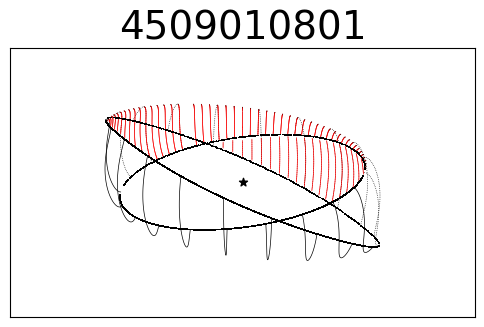

In [4]:
file=input("Which file?") #the filename from the params.txt file 'NAME' column
#presumably you are doing this after having fit model pulse profiles to your data, and can select a particular model that gave a good fit
#which you now wish to see the disk configuration for

phase=input("Phase?")
#either type 'all' (will be slow to run) or a specific phase to 3 decimal places, e.g. '0.000', to just get one (faster)

save= input("Save image?")
#'y' or 'n' as to whether you want to save the output image
#be sure to change the directory and savename for the file within the command defined above to your preferred settings

title= input("Title?")
#literally just a header to put on the plot, does not affect anything with the content of the plot
# I typically put the Observation ID of the data I am modeling/ that this particular simulation gave the best fit to

plotdisk(file,phase,save,title,source='pencil') #change the source within this line